### **Laboratorio 4: Geoespacial Parte 2**
- Juan Pablo Solis
- Isabella Miralles

Link de github
https://github.com/JPS4321/lab4_Data_Parte2

#### **Conexion a Sentinel 2**

In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from datetime import date
import openeo

In [2]:
connection = openeo.connect("https://openeo.dataspace.copernicus.eu").authenticate_oidc()

Authenticated using refresh token.


### **Descarga de Datos** 
Las bandas Descargadas son debido a que el script utilizado "Cyanobacteria Chlorophyll-a NDCI L1C" utiliza estas bandas.

Link a sccript
https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/cyanobacteria_chla_ndci_l1c/

In [3]:

bandas_cyano = ["B02", "B03", "B04", "B05", "B07", "B08", "B8A", "B11", "B12"]


lago_atitlan = {
    "west": -91.31,
    "east": -91.08,
    "south": 14.60,
    "north": 14.74,
    "crs": "EPSG:4326"
}

lago_amatitlan = {
    "west": -90.66,
    "east": -90.58,
    "south": 14.43,
    "north": 14.51,
    "crs": "EPSG:4326"
}



In [4]:
"""
# Atitlán
atitlan_cube = connection.load_collection(
    "SENTINEL2_L2A",
    spatial_extent=lago_atitlan,
    temporal_extent=["2025-06-01", "2025-08-03"],
    bands=bandas_cyano
)

# Amatitlán
amatitlan_cube = connection.load_collection(
    "SENTINEL2_L2A",
    spatial_extent=lago_amatitlan,
    temporal_extent=["2025-06-01", "2025-08-03"],
    bands=bandas_cyano
)
"""

'\n# Atitlán\natitlan_cube = connection.load_collection(\n    "SENTINEL2_L2A",\n    spatial_extent=lago_atitlan,\n    temporal_extent=["2025-06-01", "2025-08-03"],\n    bands=bandas_cyano\n)\n\n# Amatitlán\namatitlan_cube = connection.load_collection(\n    "SENTINEL2_L2A",\n    spatial_extent=lago_amatitlan,\n    temporal_extent=["2025-06-01", "2025-08-03"],\n    bands=bandas_cyano\n)\n'

In [5]:
"""
# Atitlán
result_graph_atitlan = atitlan_cube.save_result(format="GTIFF")
job_atitlan = connection.create_job(result_graph_atitlan)
job_atitlan.start_and_wait()
job_atitlan.get_results().download_files("data/Bandas_Atitlan")"""

'\n# Atitlán\nresult_graph_atitlan = atitlan_cube.save_result(format="GTIFF")\njob_atitlan = connection.create_job(result_graph_atitlan)\njob_atitlan.start_and_wait()\njob_atitlan.get_results().download_files("data/Bandas_Atitlan")'

In [6]:
"""
# Amatitlán
result_graph_amatitlan = amatitlan_cube.save_result(format="GTIFF")
job_amatitlan = connection.create_job(result_graph_amatitlan)
job_amatitlan.start_and_wait()
job_amatitlan.get_results().download_files("data/Bandas_Amatitlan")"""

'\n# Amatitlán\nresult_graph_amatitlan = amatitlan_cube.save_result(format="GTIFF")\njob_amatitlan = connection.create_job(result_graph_amatitlan)\njob_amatitlan.start_and_wait()\njob_amatitlan.get_results().download_files("data/Bandas_Amatitlan")'

#### **Visualizacion De Lagos**

#### **Lago de Amatitlan**

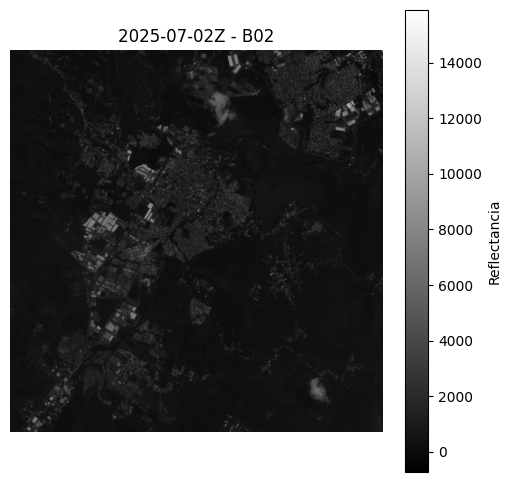

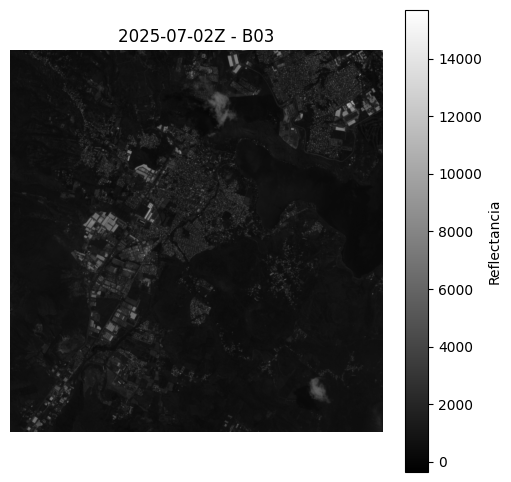

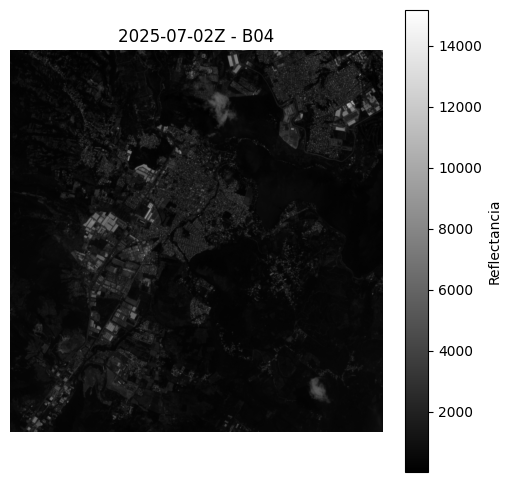

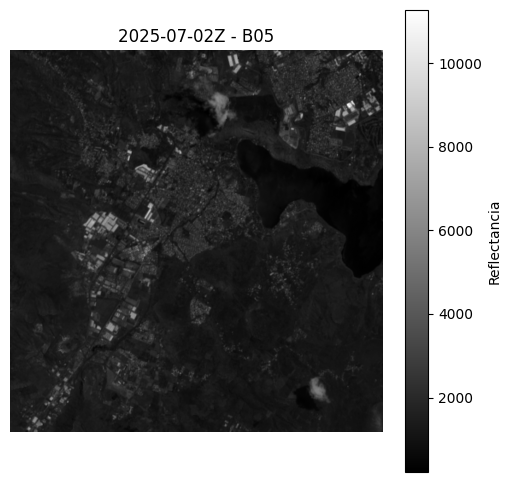

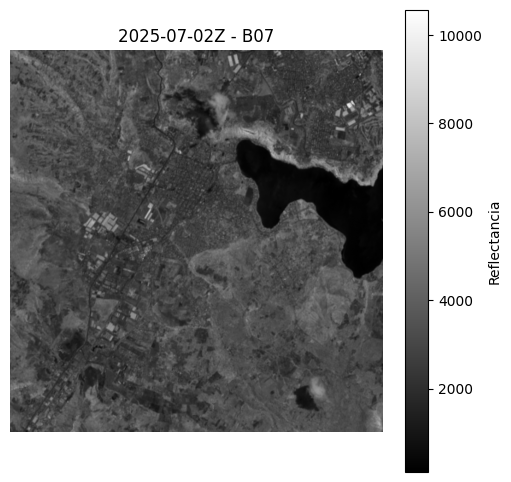

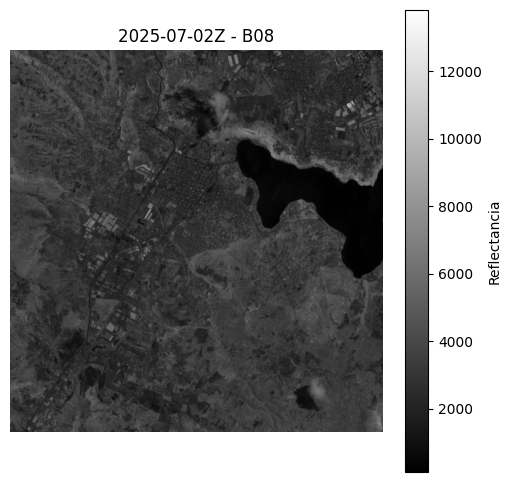

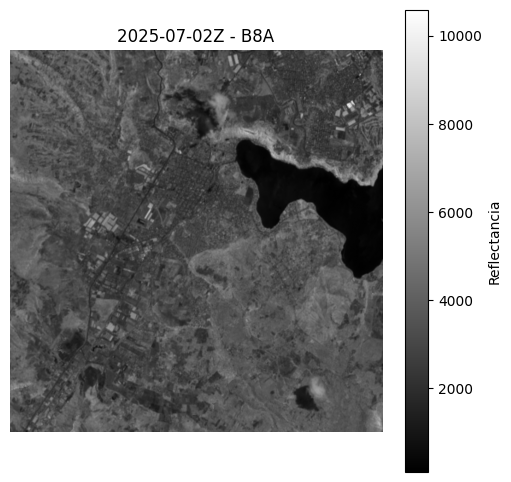

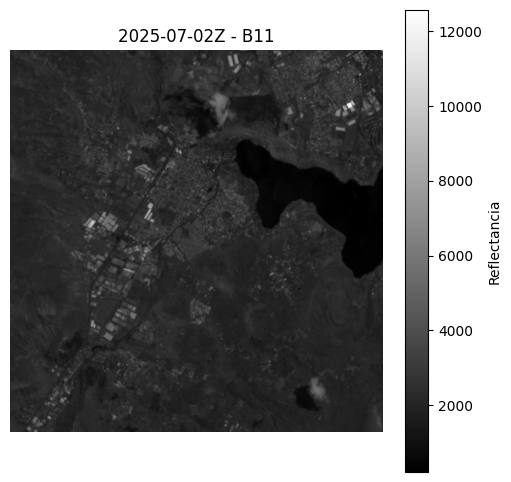

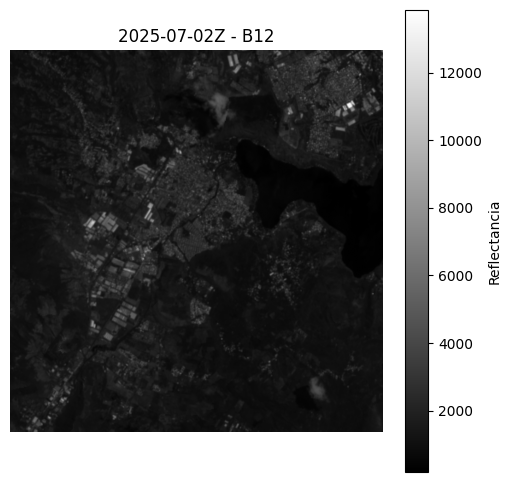

In [7]:
import os
import glob
from datetime import datetime


carpeta_amatitlan = "data/Bandas_Amatitlan"


fecha_objetivo = "2025-07-02"


patron = os.path.join(carpeta_amatitlan, f"openEO_{fecha_objetivo}Z.tif")
archivos_encontrados = glob.glob(patron)

if not archivos_encontrados:
    print(f"No se encontró archivo para la fecha {fecha_objetivo}")
else:
    ruta_tif = archivos_encontrados[0]
    fecha = os.path.basename(ruta_tif).replace("openEO_", "").replace(".tif", "")

    with rasterio.open(ruta_tif) as src:
        bandas = src.read()
        nombres = src.descriptions if src.descriptions[0] else [f"Banda {i+1}" for i in range(src.count)]
        nodata = src.nodata

    
    for i in range(bandas.shape[0]):
        plt.figure(figsize=(6, 6))
        img = bandas[i]
        img = np.ma.masked_where(img == nodata, img)
        plt.imshow(img, cmap='gray')
        plt.title(f"{fecha} - {nombres[i]}")
        plt.axis('off')
        plt.colorbar(label="Reflectancia")
        plt.show()


#### **Lago de Atitlan**

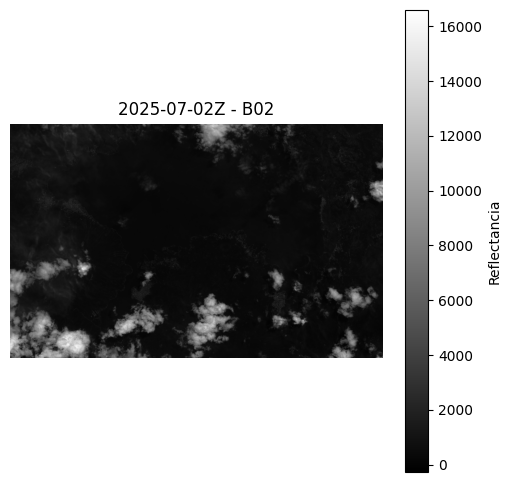

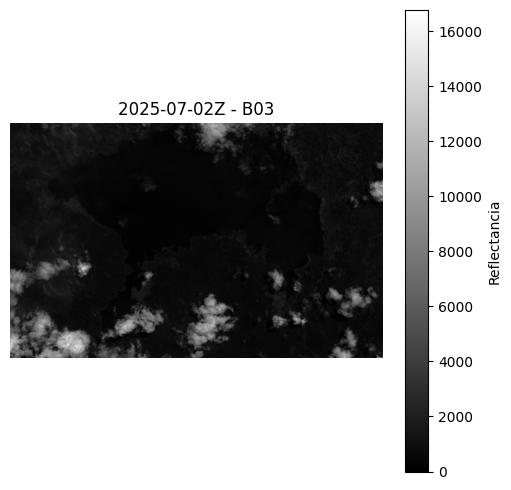

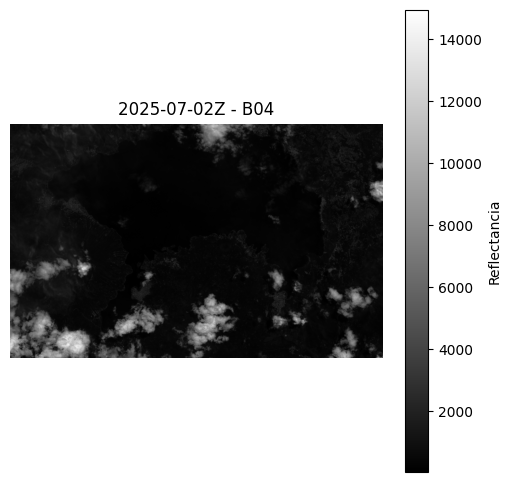

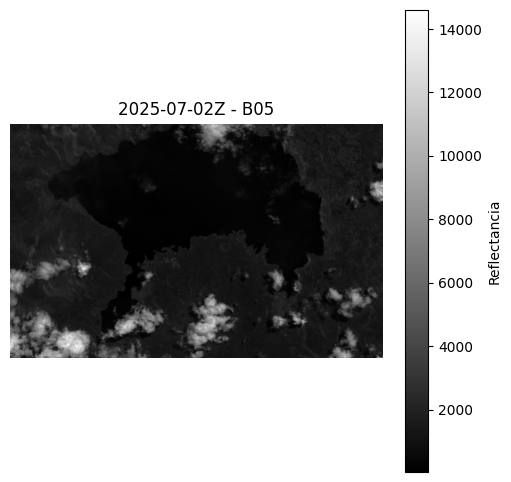

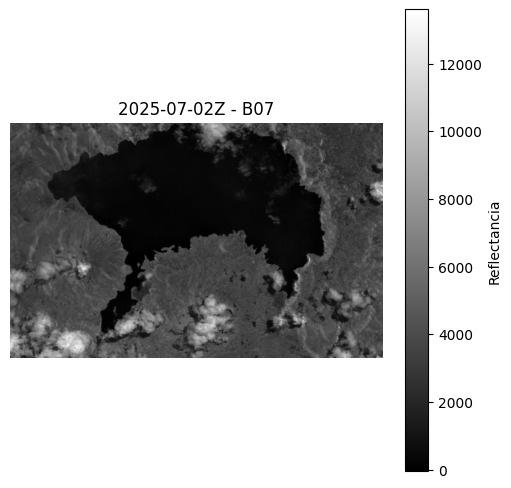

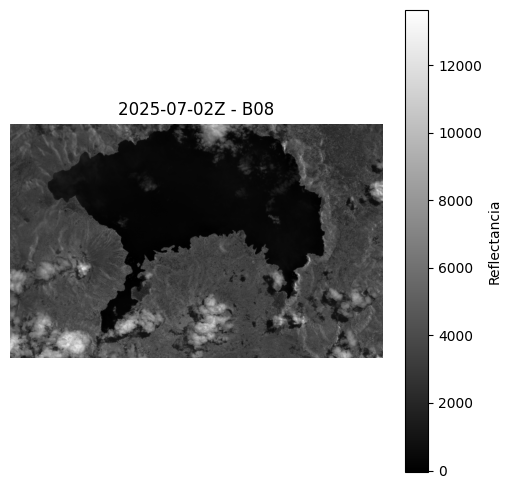

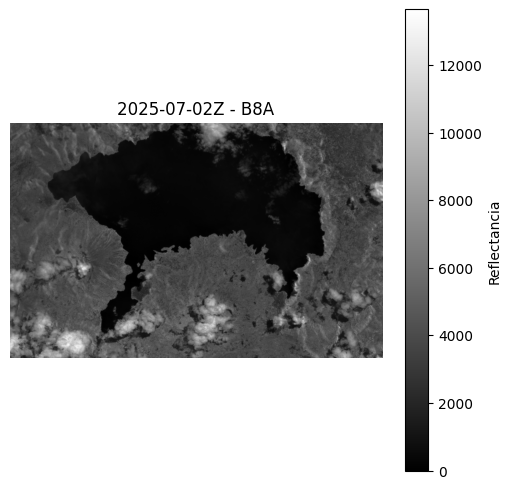

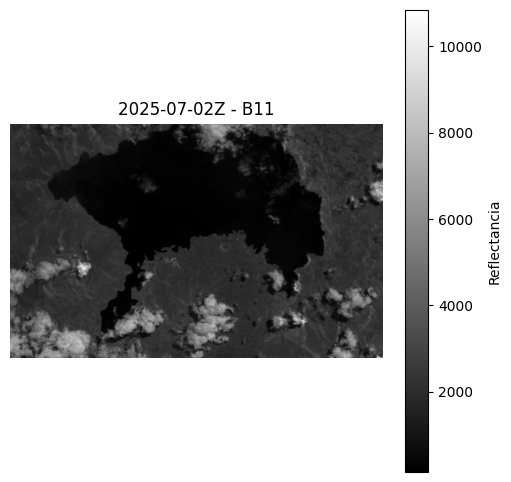

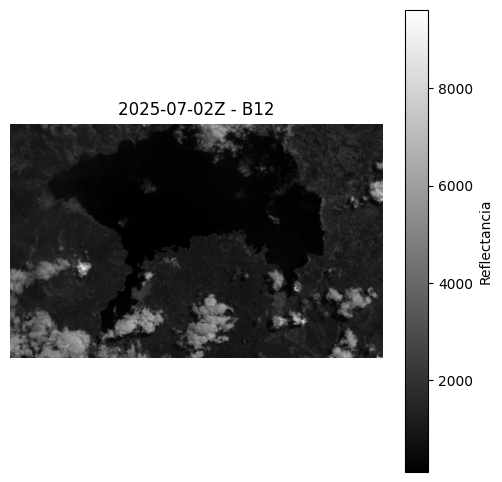

In [8]:
import os
import glob
from datetime import datetime


carpeta_amatitlan = "data/Bandas_Atitlan"


fecha_objetivo = "2025-07-02"


patron = os.path.join(carpeta_amatitlan, f"openEO_{fecha_objetivo}Z.tif")
archivos_encontrados = glob.glob(patron)

if not archivos_encontrados:
    print(f"No se encontró archivo para la fecha {fecha_objetivo}")
else:
    ruta_tif = archivos_encontrados[0]
    fecha = os.path.basename(ruta_tif).replace("openEO_", "").replace(".tif", "")

    with rasterio.open(ruta_tif) as src:
        bandas = src.read()
        nombres = src.descriptions if src.descriptions[0] else [f"Banda {i+1}" for i in range(src.count)]
        nodata = src.nodata

    
    for i in range(bandas.shape[0]):
        plt.figure(figsize=(6, 6))
        img = bandas[i]
        img = np.ma.masked_where(img == nodata, img)
        plt.imshow(img, cmap='gray')
        plt.title(f"{fecha} - {nombres[i]}")
        plt.axis('off')
        plt.colorbar(label="Reflectancia")
        plt.show()


In [9]:
with rasterio.open("data/Bandas_Atitlan/openEO_2025-07-02Z.tif") as src:
    print("Número de bandas:", src.count)
    print("Descripciones:", src.descriptions)

Número de bandas: 9
Descripciones: ('B02', 'B03', 'B04', 'B05', 'B07', 'B08', 'B8A', 'B11', 'B12')


### **Script de Cyano Bacteria Sentinel Hub**

In [10]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

def cyanolakes_chla_from_tif(
    ruta_tif: str,
    band_order: list | None = None,   
    plot: bool = True,
    MNDWI_threshold: float = 0.42,
    NDWI_threshold: float  = 0.40,
    filter_UABS: bool = True,
    use_relaxed_mask: bool = True,    
    ndwi_relax: float = 0.05,
    ndvi_max: float  = 0.25
):
    """
    Aplica el algoritmo 'CyanoLakes Chlorophyll-a L1C' (Sentinel Hub) sobre un GeoTIFF multibanda.
    Requiere las bandas: B02, B03, B04, B05, B07, B08, B8A, B11, B12.

    Retorna: dict con rgb, chl, chl_masked, water, ndci.
    """

    def safe_div(a, b):
        with np.errstate(divide='ignore', invalid='ignore'):
            out = a / b
        out[~np.isfinite(out)] = 0.0
        return out

    
    with rasterio.open(ruta_tif) as src:
        cube = src.read().astype(np.float32)   
        names = list(src.descriptions) if src.descriptions and src.descriptions[0] else None

    
    if cube.max() > 1.0:
        cube /= 10000.0

    
    needed = ["B02","B03","B04","B05","B07","B08","B8A","B11","B12"]
    if names and set(needed).issubset(set(names)):
        mapping = {names[i]: cube[i] for i in range(len(names))}
    elif band_order and len(band_order) == cube.shape[0]:
        mapping = {band_order[i]: cube[i] for i in range(len(band_order))}
    else:
        raise ValueError(
            "No pude identificar los nombres de banda. Pasa band_order= con el orden usado al descargar."
        )

    B02,B03,B04,B05,B07,B08,B8A,B11,B12 = [mapping[k] for k in needed]

    
    def wbi(r,g,b,nir,swir1,swir2):
        ndvi        = safe_div(nir - r,   nir + r)
        mndwi       = safe_div(g   - swir1, g   + swir1)
        ndwi        = safe_div(g   - nir,   g   + nir)
        ndwi_leaves = safe_div(nir - swir1, nir + swir1)
        aweish      = b + 2.5*g - 1.5*(nir + swir1) - 0.25*swir2
        aweinsh     = 4*(g - swir1) - (0.25*nir + 2.75*swir1)
        dbsi        = safe_div(swir1 - g, swir1 + g) - ndvi

        ws = (
            (mndwi > MNDWI_threshold) |
            (ndwi  > NDWI_threshold ) |
            (aweinsh > 0.1879) |
            (aweish  > 0.1112) |
            (ndvi < -0.2) |
            (ndwi_leaves > 1)
        )
        if filter_UABS:
            ws = ws & ~((aweinsh <= -0.03) | (dbsi > 0))
        return ws.astype(np.uint8)

    def FAI(a,b,c):
        
        return b - a - (c - a) * ((783 - 665) / (865 - 665))

    def NDCI(a,b):
        return safe_div(b - a, b + a)

    
    water_wbi = wbi(B04,B03,B02,B08,B11,B12)

    if use_relaxed_mask:
        ndwi_aux = safe_div(B03 - B08, B03 + B08)
        ndvi_aux = safe_div(B08 - B04, B08 + B04)
        water = np.where((water_wbi == 1) | ((ndwi_aux > ndwi_relax) & (ndvi_aux < ndvi_max)), 1, 0).astype(np.uint8)
    else:
        water = water_wbi

    FAIv  = FAI(B04, B07, B8A)
    ndci  = NDCI(B04, B05)
    chl   = 826.57*(ndci**3) - 176.43*(ndci**2) + 19*ndci + 4.071  

    
    chl_masked = np.where(water == 1, chl, np.nan)
    chl_masked[chl_masked < 0] = np.nan

    
    rgb = np.clip(np.stack([3*B04, 3*B03, 3*B02], axis=-1), 0, 1)
    mask_w = (water == 1)

    def set_color(cond, r,g,b):
        m = mask_w & cond
        rgb[m] = (r,g,b)

    set_color(FAIv>0.08,                     233/255,  72/255, 21/255)
    set_color(chl<0.5,                       0,        0,      1.0)
    set_color((chl>=0.5)&(chl<1),            0,        0,      1.0)
    set_color((chl>=1)&(chl<2.5),            0,       59/255,  1)
    set_color((chl>=2.5)&(chl<3.5),          0,       98/255,  1)
    set_color((chl>=3.5)&(chl<5),           15/255, 113/255, 141/255)
    set_color((chl>=5)&(chl<7),             14/255, 141/255, 120/255)
    set_color((chl>=7)&(chl<8),             13/255, 141/255, 103/255)
    set_color((chl>=8)&(chl<10),            30/255, 226/255,  28/255)
    set_color((chl>=10)&(chl<14),           42/255, 226/255,  28/255)
    set_color((chl>=14)&(chl<18),           68/255, 226/255,  28/255)
    set_color((chl>=18)&(chl<20),           68/255, 226/255,  28/255)
    set_color((chl>=20)&(chl<24),          134/255, 247/255,   0/255)
    set_color((chl>=24)&(chl<28),          140/255, 247/255,   0/255)
    set_color((chl>=28)&(chl<30),          205/255, 237/255,   0/255)
    set_color((chl>=30)&(chl<38),          208/255, 240/255,   0/255)
    set_color((chl>=38)&(chl<45),          208/255, 240/255,   0/255)
    set_color((chl>=45)&(chl<50),          251/255, 210/255,   3/255)
    set_color((chl>=50)&(chl<75),          248/255, 207/255,   2/255)
    set_color((chl>=75)&(chl<90),          134/255, 247/255,   0/255)
    set_color((chl>=90)&(chl<100),         245/255, 164/255,   9/255)
    set_color((chl>=100)&(chl<150),        240/255, 159/255,   8/255)
    set_color((chl>=150)&(chl<250),        237/255, 157/255,   7/255)
    set_color((chl>=250)&(chl<300),        239/255, 118/255,  15/255)
    set_color((chl>=300)&(chl<350),        239/255, 101/255,  15/255)
    set_color((chl>=350)&(chl<450),        239/255, 100/255,  14/255)
    set_color((chl>=450)&(chl<500),        233/255,  72/255,  21/255)
    set_color(chl>=500,                    233/255,  72/255,  21/255)

    if plot:
        plt.figure(figsize=(8,6))
        plt.imshow(rgb)
        plt.title("CyanoLakes")
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(8,6))
        im = plt.imshow(chl_masked, cmap="turbo")
        plt.colorbar(im, label="Clorofila-a (mg/m³)")
        plt.title("Clorofila-a (NDCI) - Solo agua")
        plt.axis('off')
        plt.show()

    return {"rgb": rgb, "chl": chl, "chl_masked": chl_masked, "water": water, "ndci": ndci}


### **Cyano Bacteria Atitlan**

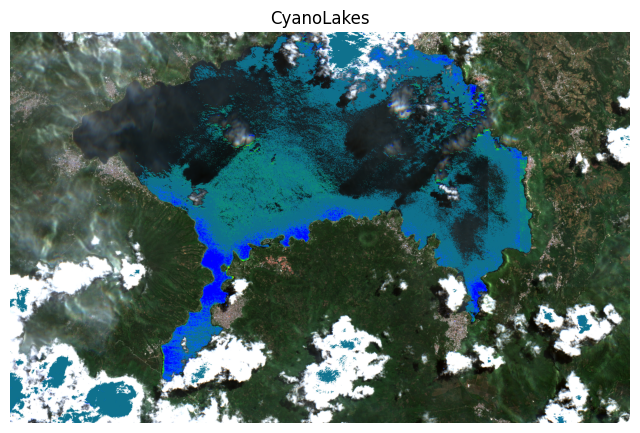

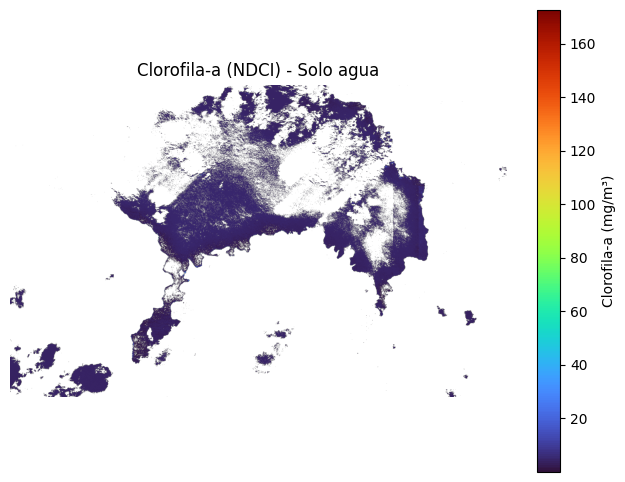

In [11]:
out = cyanolakes_chla_from_tif(
    "data/Bandas_Atitlan/openEO_2025-07-02Z.tif",
    band_order=bandas_cyano,
    plot=True
)


### **Cyano Bacteria Amatitlan**

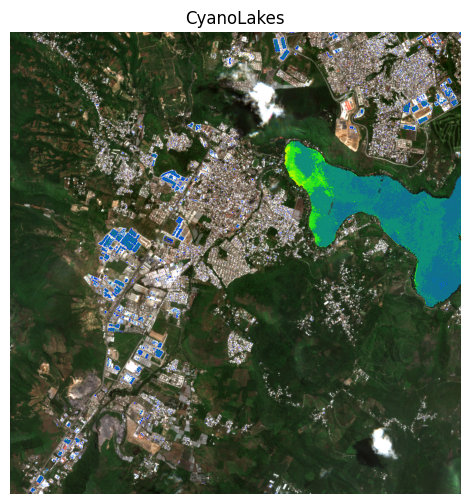

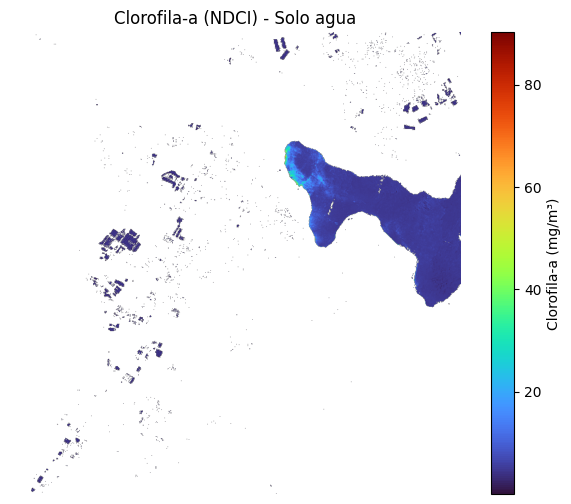

In [12]:
out = cyanolakes_chla_from_tif(
    "data/Bandas_Amatitlan/openEO_2025-07-02Z.tif",
    band_order=bandas_cyano,
    plot=True
)


### **Analisis Temporal de los lagos**

In [13]:
import glob
import os
import numpy as np
import pandas as pd

def calcular_promedios_lago(carpeta_lago, band_order):
    promedios = []
    fechas = []
    
    archivos = sorted(glob.glob(os.path.join(carpeta_lago, "*.tif")))
    for ruta_tif in archivos:
        fecha = os.path.basename(ruta_tif).replace("openEO_", "").replace("Z.tif", "")
        
        try:
            out = cyanolakes_chla_from_tif(
                ruta_tif,
                band_order=band_order,
                plot=False
            )
            chl_masked = out["chl_masked"]
            prom = np.nanmean(chl_masked)  # Promedio solo en zonas de agua
            promedios.append(prom)
            fechas.append(fecha)
        except Exception as e:
            print(f"Error en {ruta_tif}: {e}")
    
    return pd.DataFrame({"fecha": pd.to_datetime(fechas), "promedio_chla": promedios})

# Calcular para Atitlán y Amatitlán
df_atitlan = calcular_promedios_lago("data/Bandas_Atitlan", bandas_cyano)
df_amatitlan = calcular_promedios_lago("data/Bandas_Amatitlan", bandas_cyano)


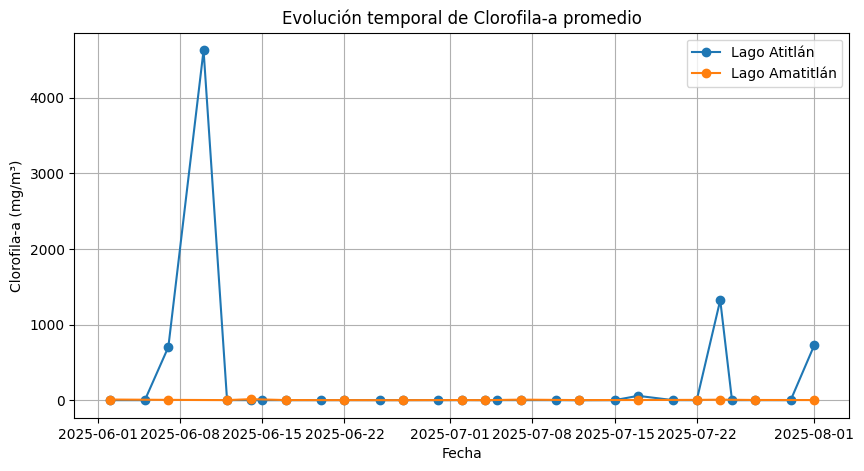

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(df_atitlan["fecha"], df_atitlan["promedio_chla"], marker="o", label="Lago Atitlán")
plt.plot(df_amatitlan["fecha"], df_amatitlan["promedio_chla"], marker="o", label="Lago Amatitlán")
plt.title("Evolución temporal de Clorofila-a promedio")
plt.xlabel("Fecha")
plt.ylabel("Clorofila-a (mg/m³)")
plt.legend()
plt.grid(True)
plt.show()


In [15]:
def detectar_picos(df, umbral_factor=1.5):
    """
    Detecta picos de clorofila-a usando un factor multiplicativo
    sobre la mediana como umbral.
    """
    mediana = np.nanmedian(df["promedio_chla"])
    umbral = mediana * umbral_factor
    picos = df[df["promedio_chla"] >= umbral]
    return picos, umbral

picos_atitlan, umbral_atitlan = detectar_picos(df_atitlan)
picos_amatitlan, umbral_amatitlan = detectar_picos(df_amatitlan)

print("📌 Picos Lago Atitlán (umbral {:.2f} mg/m³):".format(umbral_atitlan))
print(picos_atitlan)

print("\n📌 Picos Lago Amatitlán (umbral {:.2f} mg/m³):".format(umbral_amatitlan))
print(picos_amatitlan)


📌 Picos Lago Atitlán (umbral 6.27 mg/m³):
        fecha  promedio_chla
2  2025-06-07     705.948059
3  2025-06-10    4625.217285
20 2025-07-17      61.138863
23 2025-07-24    1325.057373
27 2025-08-01     726.863220

📌 Picos Lago Amatitlán (umbral 9.11 mg/m³):
        fecha  promedio_chla
0  2025-06-02      12.509706
3  2025-06-14      17.342945
9  2025-07-07      11.111246
13 2025-07-24      10.558614


In [16]:
import os, re, glob
import numpy as np
import pandas as pd
import rasterio
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib import cm
import folium

atitlan_folder = "data/Bandas_Atitlan"       
amatitlan_folder = "data/Bandas_Amatitlan"   

default_band_order = ["B02","B03","B04","B05","B06","B07","B08","B8A","B11","B12"]

def list_tifs(folder):
    return sorted(glob.glob(os.path.join(folder, "*.tif")))

_date_re = re.compile(r'(\d{4}-\d{2}-\d{2})|(\d{8})')
def parse_date_from_filename(fname):
    m = _date_re.search(fname)
    if not m:
        return None
    s = m.group(1) or m.group(2)
    if len(s) == 8:
        return datetime.strptime(s, "%Y%m%d").date()
    return datetime.strptime(s, "%Y-%m-%d").date()

def load_raster(fn):
    src = rasterio.open(fn)
    arr = src.read().astype(np.float32)
    meta = src.meta.copy()
    desc = src.descriptions if hasattr(src, "descriptions") else None
    src.close()
    return arr, meta, desc

def make_band_map(descriptions, band_count):
    mapping = {}
    if descriptions and any(descriptions):
        for i, d in enumerate(descriptions):
            if d:
                key = d.strip().upper()
                key = key.replace("BAND ", "B").replace("BAND", "B")
                mapping[key] = i
    if not mapping:
        for i, b in enumerate(default_band_order[:band_count]):
            mapping[b] = i
    return mapping

def safe_div(a, b):
    with np.errstate(divide='ignore', invalid='ignore'):
        r = np.true_divide(a, b)
        r[~np.isfinite(r)] = np.nan
    return r

def compute_ndci(arr, band_map):
    b04 = arr[band_map['B04']].astype(np.float32)
    b05 = arr[band_map['B05']].astype(np.float32)
    return safe_div(b05 - b04, b05 + b04)

def compute_ndvi(arr, band_map):
    b04 = arr[band_map['B04']].astype(np.float32)
    b08 = arr[band_map['B08']].astype(np.float32)
    return safe_div(b08 - b04, b08 + b04)

def compute_ndwi(arr, band_map):
    b03 = arr[band_map['B03']].astype(np.float32)  
    b08 = arr[band_map['B08']].astype(np.float32)  
    return safe_div(b03 - b08, b03 + b08)


In [17]:
def process_folder(folder):
    rows = []
    for fn in list_tifs(folder):
        date = parse_date_from_filename(fn) or datetime.fromtimestamp(os.path.getmtime(fn)).date()
        arr, meta, desc = load_raster(fn)
        band_count = arr.shape[0]
        band_map = make_band_map(desc, band_count)

        cyano_arr = None
        if desc and any(d and "CYANO" in d.upper() for d in desc if d):
            idx = next(i for i,d in enumerate(desc) if d and "CYANO" in d.upper())
            cyano_arr = arr[idx].astype(np.float32)
        else:
            required = ['B04','B05','B03','B08']
            if not all(k in band_map for k in required):
                band_map = {b:i for i,b in enumerate(default_band_order[:band_count])}
            cyano_arr = compute_ndci(arr, band_map)

        ndvi_arr = compute_ndvi(arr, band_map)
        ndwi_arr = compute_ndwi(arr, band_map)

        water_mask = ndwi_arr > 0.0

        masked_cyano = np.where(water_mask, cyano_arr, np.nan)
        masked_ndvi  = np.where(water_mask, ndvi_arr,  np.nan)
        masked_ndwi  = np.where(np.isfinite(ndwi_arr), ndwi_arr, np.nan)  

        mean_cyano = np.nanmean(masked_cyano)
        max_cyano  = np.nanmax(masked_cyano)
        p95_cyano  = np.nanpercentile(masked_cyano[~np.isnan(masked_cyano)], 95) if np.any(~np.isnan(masked_cyano)) else np.nan

        mean_ndvi = np.nanmean(masked_ndvi)
        mean_ndwi = np.nanmean(masked_ndwi)

        rows.append({
            "date": pd.to_datetime(date),
            "file": fn,
            "mean_cyano": mean_cyano,
            "max_cyano": max_cyano,
            "p95_cyano": p95_cyano,
            "mean_ndvi": mean_ndvi,
            "mean_ndwi": mean_ndwi
        })

    df = pd.DataFrame(rows).sort_values("date").reset_index(drop=True)
    return df

df_at = process_folder(atitlan_folder)
df_am = process_folder(amatitlan_folder)

print("Atitlán:", df_at.shape[0], "fechas")
display(df_at.head())
print("Amatitlán:", df_am.shape[0], "fechas")
display(df_am.head())


Atitlán: 28 fechas


,date,file,mean_cyano,max_cyano,p95_cyano,mean_ndvi,mean_ndwi
0,2025-06-02,data/Bandas_Atitlan\openEO_2025-06-02Z.tif,0.016524,0.258916,0.035331,0.016209,-0.086667
1,2025-06-05,data/Bandas_Atitlan\openEO_2025-06-05Z.tif,0.024935,0.352809,0.042248,0.011684,-0.049202
2,2025-06-07,data/Bandas_Atitlan\openEO_2025-06-07Z.tif,0.021677,81.000000,0.109489,-0.079727,-0.156426
3,2025-06-10,data/Bandas_Atitlan\openEO_2025-06-10Z.tif,0.026935,69.000000,0.087838,-0.060770,-0.040691
4,2025-06-12,data/Bandas_Atitlan\openEO_2025-06-12Z.tif,0.039704,0.182674,0.056879,0.019552,-0.093072


Amatitlán: 16 fechas


,date,file,mean_cyano,max_cyano,p95_cyano,mean_ndvi,mean_ndwi
0,2025-06-02,data/Bandas_Amatitlan\openEO_2025-06-02Z.tif,0.067746,0.544634,0.328423,0.000592,-0.193519
1,2025-06-07,data/Bandas_Amatitlan\openEO_2025-06-07Z.tif,0.024907,0.661482,0.203705,-0.111063,-0.153381
2,2025-06-12,data/Bandas_Amatitlan\openEO_2025-06-12Z.tif,0.071630,0.232678,0.166443,0.018970,-0.240417
3,2025-06-14,data/Bandas_Amatitlan\openEO_2025-06-14Z.tif,0.142891,0.585395,0.412678,-0.044749,-0.431565
4,2025-06-17,data/Bandas_Amatitlan\openEO_2025-06-17Z.tif,0.064154,0.307757,0.180008,0.036934,-0.229525


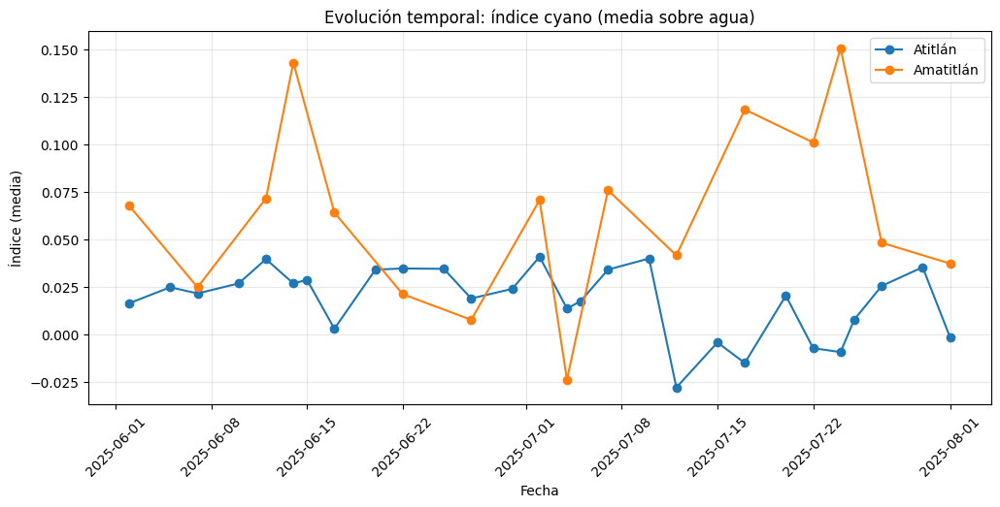

Atitlán - umbral: 0.054716855


,date,file,mean_cyano,max_cyano,p95_cyano,mean_ndvi,mean_ndwi


Amatitlán - umbral: 0.15885589


,date,file,mean_cyano,max_cyano,p95_cyano,mean_ndvi,mean_ndwi


In [18]:
plt.figure(figsize=(12,5))
plt.plot(df_at['date'], df_at['mean_cyano'], '-o', label='Atitlán')
plt.plot(df_am['date'], df_am['mean_cyano'], '-o', label='Amatitlán')
plt.legend()
plt.title('Evolución temporal: índice cyano (media sobre agua)')
plt.xlabel('Fecha'); plt.ylabel('Índice (media)')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.show()

def detect_peaks(df, z=2.0):
    mu = df['mean_cyano'].mean()
    sigma = df['mean_cyano'].std()
    threshold = mu + z * sigma
    peaks = df[df['mean_cyano'] > threshold]
    return {"threshold": threshold, "peaks": peaks}

peaks_at = detect_peaks(df_at, z=2)
peaks_am = detect_peaks(df_am, z=2)

print("Atitlán - umbral:", peaks_at['threshold'])
display(peaks_at['peaks'])
print("Amatitlán - umbral:", peaks_am['threshold'])
display(peaks_am['peaks'])


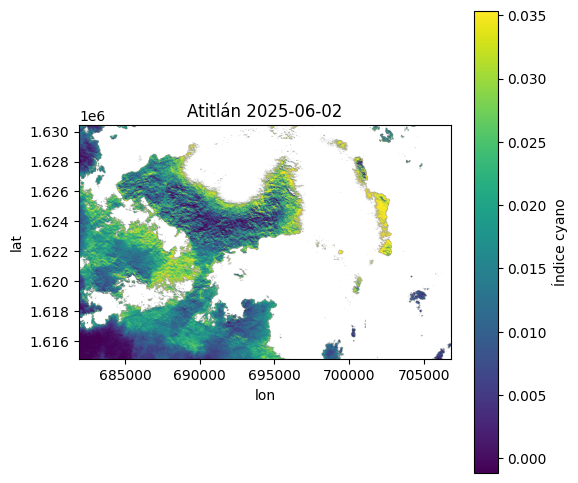

C:\Users\Usuario\AppData\Local\Temp\ipykernel_11684\2465025901.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_m = cm.get_cmap(cmap)



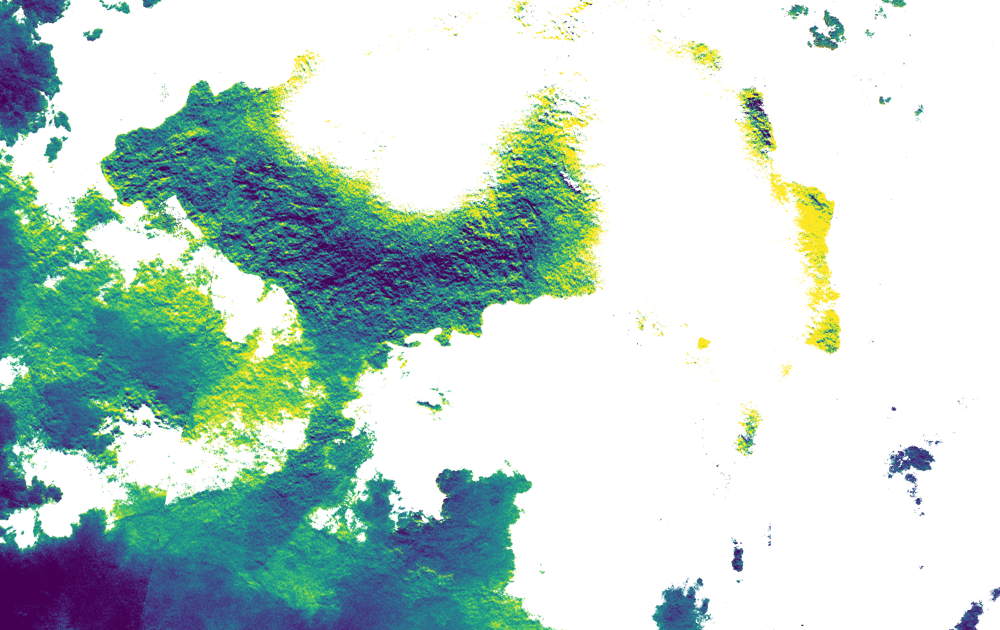

In [19]:
import matplotlib.pyplot as plt
import tempfile

def plot_index_map(fn, vmin=None, vmax=None, cmap='viridis', title=None):
    arr, meta, desc = load_raster(fn)
    band_map = make_band_map(desc, arr.shape[0])
    if desc and any(d and "CYANO" in d.upper() for d in desc if d):
        idx = next(i for i,d in enumerate(desc) if d and "CYANO" in d.upper())
        im = arr[idx]
    else:
        im = compute_ndci(arr, band_map)
    ndwi = compute_ndwi(arr, band_map)
    water_mask = ndwi > 0.0
    im_masked = np.where(water_mask, im, np.nan)

    with rasterio.open(fn) as src:
        bounds = src.bounds

    if vmin is None: vmin = np.nanpercentile(im_masked, 5)
    if vmax is None: vmax = np.nanpercentile(im_masked, 95)

    plt.figure(figsize=(6,6))
    plt.imshow(im_masked, extent=(bounds.left, bounds.right, bounds.bottom, bounds.top),
               origin='upper', cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(label='Índice cyano')
    plt.title(title or os.path.basename(fn))
    plt.xlabel('lon'); plt.ylabel('lat')
    plt.show()

if not df_at.empty:
    plot_index_map(df_at.loc[0, 'file'], title=f"Atitlán {df_at.loc[0,'date'].date()}")

def folium_overlay(fn, out_png=None, cmap='viridis'):
    arr, meta, desc = load_raster(fn)
    band_map = make_band_map(desc, arr.shape[0])
    if desc and any(d and "CYANO" in d.upper() for d in desc if d):
        idx = next(i for i,d in enumerate(desc) if d and "CYANO" in d.upper())
        im = arr[idx]
    else:
        im = compute_ndci(arr, band_map)
    ndwi = compute_ndwi(arr, band_map)
    water_mask = ndwi > 0.0
    im_masked = np.where(water_mask, im, np.nan)

    vmin = np.nanpercentile(im_masked, 5)
    vmax = np.nanpercentile(im_masked, 95)
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    cmap_m = cm.get_cmap(cmap)
    rgba = cmap_m(norm(im_masked))
    rgba[np.isnan(im_masked)] = (0,0,0,0)  

    if out_png is None:
        out_png = os.path.join(tempfile.gettempdir(), f"overlay_{os.path.basename(fn)}.png")

    plt.imsave(out_png, rgba)  

    with rasterio.open(fn) as src:
        bounds = src.bounds
    center = [(bounds.top + bounds.bottom)/2, (bounds.left + bounds.right)/2]
    m = folium.Map(location=center, zoom_start=11)
    folium.raster_layers.ImageOverlay(out_png,
                                     bounds=[[bounds.bottom, bounds.left], [bounds.top, bounds.right]],
                                     opacity=0.7,
                                     interactive=True,
                                     name=os.path.basename(fn)).add_to(m)
    folium.LayerControl().add_to(m)
    return m

if not df_at.empty:
    m = folium_overlay(df_at.loc[0, 'file'])
    display(m)


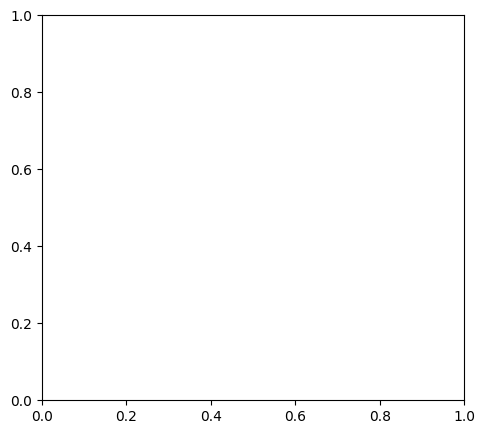

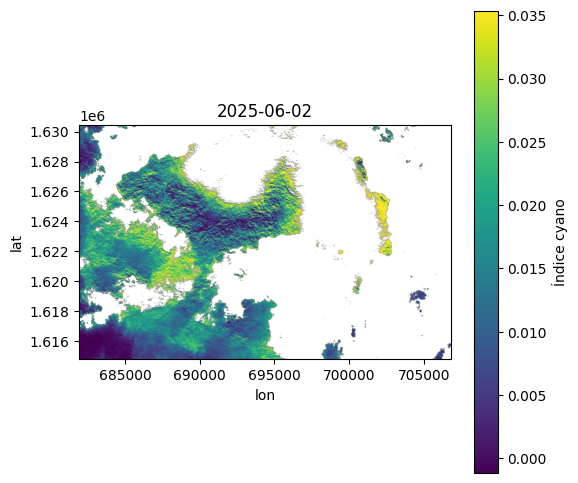

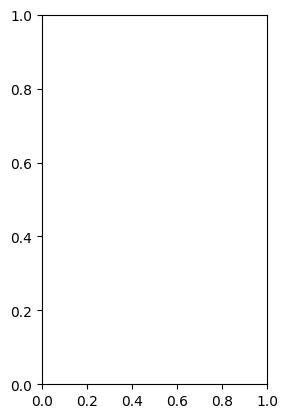

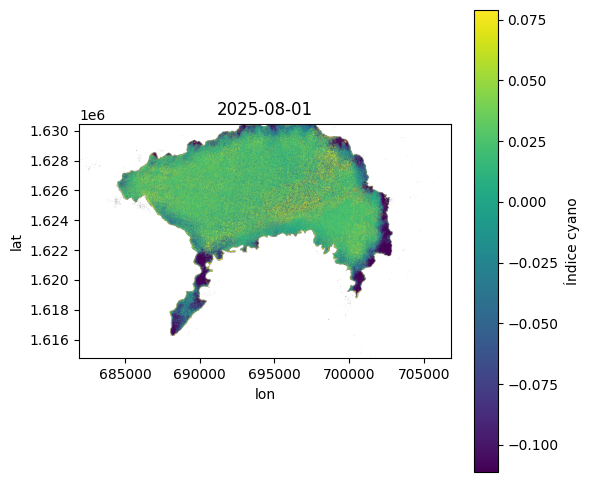

<Figure size 640x480 with 0 Axes>

In [20]:
def plot_two_dates(fn1, fn2, title1=None, title2=None, cmap='viridis'):
    arr1, _, _ = load_raster(fn1)
    arr2, _, _ = load_raster(fn2)
    with rasterio.open(fn1) as s1:
        b1 = s1.bounds
    with rasterio.open(fn2) as s2:
        b2 = s2.bounds

    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plot_index_map(fn1, cmap=cmap, title=title1)
    plt.subplot(1,2,2)
    plot_index_map(fn2, cmap=cmap, title=title2)
    plt.suptitle("Comparativo entre fechas")
    plt.show()

if len(df_at)>=2:
    plot_two_dates(df_at.loc[0,'file'], df_at.loc[len(df_at)-1,'file'], 
                   title1=str(df_at.loc[0,'date'].date()), title2=str(df_at.loc[len(df_at)-1,'date'].date()))


Correlaciones (Pearson) para Atitlán
            mean_cyano  mean_ndvi  mean_ndwi
mean_cyano    1.000000   0.632808   0.407105
mean_ndvi     0.632808   1.000000   0.382776
mean_ndwi     0.407105   0.382776   1.000000


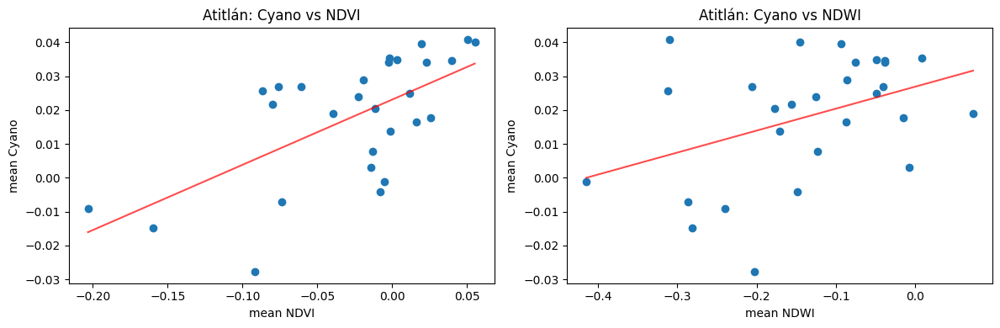

Correlaciones (Pearson) para Amatitlán
            mean_cyano  mean_ndvi  mean_ndwi
mean_cyano    1.000000  -0.062881  -0.654254
mean_ndvi    -0.062881   1.000000   0.293796
mean_ndwi    -0.654254   0.293796   1.000000


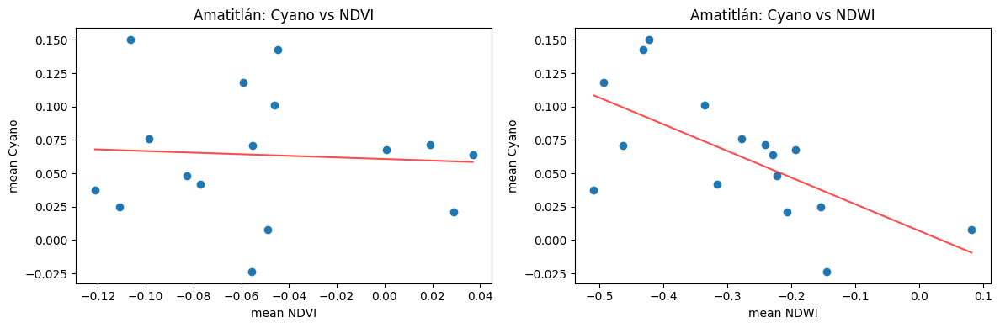

In [21]:
def corr_analysis(df, name):
    sub = df[['date','mean_cyano','mean_ndvi','mean_ndwi']].dropna()
    print("Correlaciones (Pearson) para", name)
    print(sub[['mean_cyano','mean_ndvi','mean_ndwi']].corr())
    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    plt.scatter(sub['mean_ndvi'], sub['mean_cyano'])
    plt.xlabel('mean NDVI'); plt.ylabel('mean Cyano')
    plt.title(f'{name}: Cyano vs NDVI')
    if len(sub)>=2:
        m,b = np.polyfit(sub['mean_ndvi'], sub['mean_cyano'], 1)
        xs = np.array([sub['mean_ndvi'].min(), sub['mean_ndvi'].max()])
        plt.plot(xs, m*xs + b, color='red', alpha=0.7)

    plt.subplot(1,2,2)
    plt.scatter(sub['mean_ndwi'], sub['mean_cyano'])
    plt.xlabel('mean NDWI'); plt.ylabel('mean Cyano')
    plt.title(f'{name}: Cyano vs NDWI')
    if len(sub)>=2:
        m,b = np.polyfit(sub['mean_ndwi'], sub['mean_cyano'], 1)
        xs = np.array([sub['mean_ndwi'].min(), sub['mean_ndwi'].max()])
        plt.plot(xs, m*xs + b, color='red', alpha=0.7)
    plt.tight_layout()
    plt.show()

corr_analysis(df_at, "Atitlán")
corr_analysis(df_am, "Amatitlán")


In [22]:
def bloom_metrics(df, z=2.0):
    mu = df['mean_cyano'].mean()
    sigma = df['mean_cyano'].std()
    threshold = mu + z*sigma
    n_blooms = int((df['mean_cyano'] > threshold).sum())
    freq = n_blooms / len(df) if len(df)>0 else np.nan
    mean_peak = df.loc[df['mean_cyano']>threshold, 'max_cyano'].mean()
    return {
        "n_dates": len(df),
        "n_blooms": n_blooms,
        "freq": freq,
        "mean_peak": mean_peak,
        "threshold": threshold
    }

metrics_at = bloom_metrics(df_at, z=2.0)
metrics_am = bloom_metrics(df_am, z=2.0)
pd.DataFrame([metrics_at, metrics_am], index=["Atitlán","Amatitlán"])


,n_dates,n_blooms,freq,mean_peak,threshold
Atitlán,28,0,0.0,NaN,0.054717
Amatitlán,16,0,0.0,NaN,0.158856



--- Atitlán ---
MAE:  0.00642
RMSE: 0.00890
MAPE: 61.37%

Predicción de los próximos 5 días:
2025-08-02   -0.006142
2025-08-03    0.000616
2025-08-04    0.000298
2025-08-05   -0.000190
2025-08-06    0.001654
Freq: D, Name: predicted_mean, dtype: float64


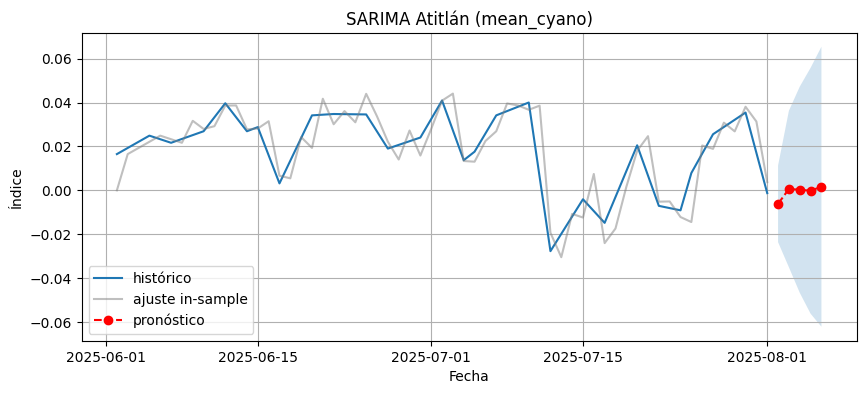


--- Amatitlán ---
MAE:  0.01457
RMSE: 0.01973
MAPE: 36.12%

Predicción de los próximos 5 días:
2025-08-02    0.043343
2025-08-03    0.043181
2025-08-04    0.047479
2025-08-05    0.046179
2025-08-06    0.050011
Freq: D, Name: predicted_mean, dtype: float64


c:\Users\Usuario\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


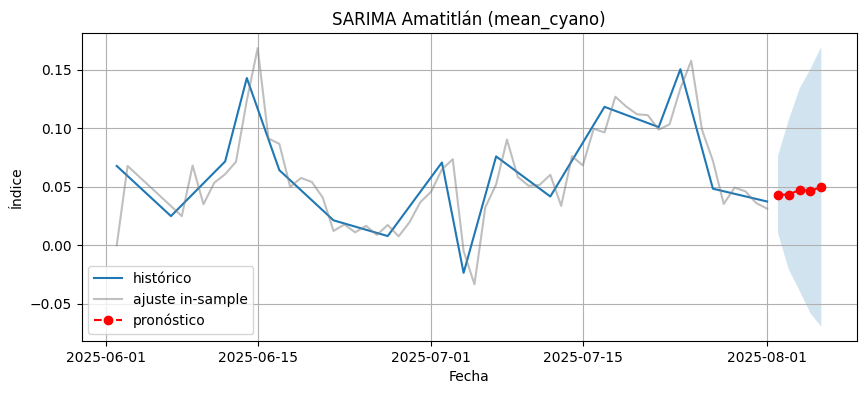

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

def sarima_forecast_with_error(df, name, steps=5, order=(1,1,1), seasonal_order=(1,1,1,7)):
    """
    Ajusta SARIMA, calcula errores en ajuste in-sample y predice pasos futuros.
    """
    ts = df.set_index('date')['mean_cyano'].asfreq('D')
    ts = ts.interpolate()  

    
    model = SARIMAX(ts, order=order, seasonal_order=seasonal_order)
    res = model.fit(disp=False)

    
    pred = res.get_forecast(steps=steps)
    pred_ci = pred.conf_int()

    
    fitted = res.fittedvalues
    mae = mean_absolute_error(ts, fitted)
    rmse = np.sqrt(mean_squared_error(ts, fitted))
    mape = (abs((ts - fitted) / ts).replace([np.inf, -np.inf], np.nan).dropna()).mean() * 100

    print(f"\n--- {name} ---")
    print(f"MAE:  {mae:.5f}")
    print(f"RMSE: {rmse:.5f}")
    print(f"MAPE: {mape:.2f}%\n")

    print(f"Predicción de los próximos {steps} días:")
    print(pred.predicted_mean)

    
    plt.figure(figsize=(10,4))
    plt.plot(ts.index, ts, label='histórico')
    plt.plot(fitted.index, fitted, color='gray', alpha=0.5, label='ajuste in-sample')
    plt.plot(pred.predicted_mean.index, pred.predicted_mean, 'r--', marker='o', label='pronóstico')
    plt.fill_between(pred_ci.index, pred_ci.iloc[:,0], pred_ci.iloc[:,1], alpha=0.2)
    plt.title(f'SARIMA {name} (mean_cyano)')
    plt.xlabel('Fecha')
    plt.ylabel('Índice')
    plt.legend()
    plt.grid(True)
    plt.show()

sarima_forecast_with_error(df_at.copy(), 'Atitlán', steps=5)
sarima_forecast_with_error(df_am.copy(), 'Amatitlán', steps=5)


El modelo SARIMA fue ajustado utilizando los valores históricos del índice mean_cyano correspondientes a los lagos Atitlán y Amatitlán, con el objetivo de predecir su comportamiento durante los cinco días posteriores al último registro disponible. Previo al modelado, se interpoló la serie para asegurar una frecuencia diaria uniforme y, posteriormente, se estimó un modelo con estructura estacional semanal (p,d,q) = (1,1,1), (P,D,Q,s) = (1,1,1,7).

En el caso del Lago Atitlán, el modelo obtuvo un error absoluto medio de aproximadamente 0.0064 y un RMSE de 0.0089, lo que sugiere una baja desviación promedio entre los valores observados y los estimados dentro del período de ajuste. Sin embargo, el MAPE alcanzó un 61.37 %, lo cual es elevado; esto se debe a que los valores del índice son muy pequeños e incluso cercanos a cero, haciendo que pequeñas variaciones relativas generen porcentajes de error muy altos. En consecuencia, para este lago se considera más apropiado interpretar el rendimiento del modelo con métricas absolutas (MAE/RMSE), donde se evidencia que el ajuste es razonable y el modelo captura adecuadamente la tendencia general de la serie.

Para el Lago Amatitlán, se obtuvieron MAE = 0.0146, RMSE = 0.0197 y un MAPE de 36.12 %. Estos resultados indican un desempeño mejor que en Atitlán, debido a que el índice mean_cyano en Amatitlán toma valores más altos y estables, lo cual reduce la sensibilidad del MAPE y permite evaluar correctamente el ajuste relativo. El modelo logra reproducir exitosamente la dinámica general de aumento y descenso del índice, ofreciendo un pronóstico coherente para los cinco días siguientes. Visualmente, el ajuste in-sample muestra que el SARIMA logra seguir los patrones observados, y las predicciones caen dentro de un intervalo de incertidumbre razonable.

In [ ]:
"""from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from tqdm import tqdm, trange
import numpy as np
import random

def build_dataset_from_folder(folder, max_files=10, max_pixels_per_tif=10000):
    X_rows, y_rows = [], []
    all_tifs = sorted(glob.glob(os.path.join(folder, '*.tif')))
    
    tifs = random.sample(all_tifs, min(max_files, len(all_tifs)))

    for fn in tqdm(tifs, desc=f"Cargando {os.path.basename(folder)}"):
        arr, meta, desc = load_raster(fn)
        band_map = make_band_map(desc, arr.shape[0])

        ndvi = compute_ndvi(arr, band_map)
        ndwi = compute_ndwi(arr, band_map)
        ndci = compute_ndci(arr, band_map)

        
        selected_bands = ['B04', 'B05', 'B08', 'B8A']

        bands_stacked = []
        for b in selected_bands:
            idx = band_map[b]
            bands_stacked.append(arr[idx].astype(np.float32))
        bands_stacked = np.stack(bands_stacked, axis=0)

        
        H, W = ndci.shape
        X = np.vstack([bands_stacked.reshape(len(selected_bands), -1),
                    ndvi.reshape(1, -1),
                    ndwi.reshape(1, -1)]).T



        y = (ndci.reshape(-1) >= 0.02).astype(int)

        mask_valid = ~np.isnan(ndci.reshape(-1))
        X = X[mask_valid]
        y = y[mask_valid]

        
        if len(y) > max_pixels_per_tif:
            idxs = np.random.choice(len(y), max_pixels_per_tif, replace=False)
            X = X[idxs]
            y = y[idxs]

        X_rows.append(X)
        y_rows.append(y)

    return np.vstack(X_rows), np.hstack(y_rows)


def train_rf_on_folder(folder, name):
    print(f"\n=== Modelo Random Forest para {name} ===")
    X, y = build_dataset_from_folder(folder, max_files=10)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    print("Entrenando modelo...")
    clf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
    for _ in trange(1, desc="Entrenamiento", leave=False):
        clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))
    print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
    return clf



model_at = train_rf_on_folder("data/Bandas_Atitlan", "Atitlán")
model_am = train_rf_on_folder("data/Bandas_Amatitlan", "Amatitlán")"""



=== Modelo Random Forest para Atitlán ===


Cargando Bandas_Atitlan: 100%|██████████| 10/10 [00:08<00:00,  1.18it/s]


Entrenando modelo...


Accuracy: 0.9498
Matriz de confusión:
 [[9453  744]
 [ 260 9543]]
Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95     10197
           1       0.93      0.97      0.95      9803

    accuracy                           0.95     20000
   macro avg       0.95      0.95      0.95     20000
weighted avg       0.95      0.95      0.95     20000


=== Modelo Random Forest para Amatitlán ===


Cargando Bandas_Amatitlan: 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]


Entrenando modelo...


Accuracy: 0.95135
Matriz de confusión:
 [[ 3035   658]
 [  315 15992]]
Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.91      0.82      0.86      3693
           1       0.96      0.98      0.97     16307

    accuracy                           0.95     20000
   macro avg       0.93      0.90      0.92     20000
weighted avg       0.95      0.95      0.95     20000



In [25]:
import pickle


with open("model_atitlan.pkl", "wb") as f:
    pickle.dump(model_at, f)


with open("model_amatitlan.pkl", "wb") as f:
    pickle.dump(model_am, f)

print("Modelos guardados exitosamente.")


Modelos guardados exitosamente.


In [ ]:
import pickle
import rasterio
from rasterio.transform import rowcol
import numpy as np


tif_prueba = "data/Bandas_Amatitlan/openEO_2025-07-17Z.tif"  
lago = "Amatitlán"  
coord = (756555, 1601040)  


if lago.lower().startswith("a"):
    with open("model_atitlan.pkl", "rb") as f:
        model = pickle.load(f)
else:
    with open("model_amatitlan.pkl", "rb") as f:
        model = pickle.load(f)


arr, meta, desc = load_raster(tif_prueba)
band_map = make_band_map(desc, arr.shape[0])


with rasterio.open(tif_prueba) as src:
    i, j = rowcol(src.transform, coord[0], coord[1])  

print(f"Pixel localizado: fila={i}, columna={j}")


selected_bands = ['B04','B05','B08','B8A']
band_values = []
for b in selected_bands:
    idx = band_map[b]
    band_values.append(float(arr[idx, i, j]))

ndvi = compute_ndvi(arr, band_map)[i,j]
ndwi = compute_ndwi(arr, band_map)[i,j]

X_point = np.array(band_values + [ndvi, ndwi]).reshape(1,-1)


pred = model.predict(X_point)[0]
print(f"Punto {coord} → {'TIENE cianobacteria (1)' if pred==1 else 'NO tiene (0)'}")


Pixel localizado: fila=448, columna=436
Punto (756555, 1601040) → TIENE cianobacteria (1)


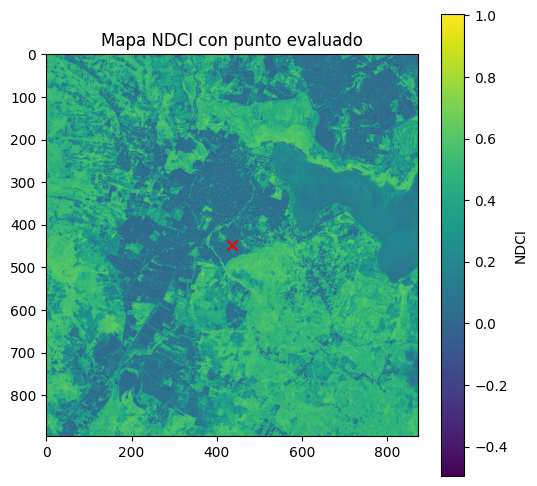

Valor NDCI real en el punto: 0.0495610311627388


In [ ]:
import matplotlib.pyplot as plt


ndci_map = compute_ndci(arr, band_map)


plt.figure(figsize=(6,6))
plt.imshow(ndci_map, cmap='viridis')
plt.colorbar(label='NDCI')
plt.scatter(j, i, c='red', s=50, marker='x')  
plt.title('Mapa NDCI con punto evaluado')
plt.show()


print(f"Valor NDCI real en el punto: {ndci_map[i,j]}")


Se entrenaron dos modelos clasificadores Random Forest independientes, uno para el lago Atitlán y otro para Amatitlán, utilizando únicamente diez imágenes .tif por lago con muestreo aleatorio de píxeles. Como variables predictoras se seleccionaron las bandas espectrales más sensibles a floraciones (B04, B05, B08, B8A), así como los índices NDVI y NDWI, mientras que la etiqueta de presencia de cianobacteria (label) se definió a partir del valor del índice NDCI, considerando como positivo todo pixel con NDCI ≥ 0.02. Se realizaron divisiones entrenamiento/prueba de 80/20 estratificadas para asegurar adecuada proporción de clases.

En el caso del lago Atitlán el modelo alcanzó una exactitud del 94.9 %, con un F1-score de 0.95 para la detección de bloom. El recall de 0.97 indica que el modelo es altamente sensible para identificar pixels con presencia de cianobacteria, mientras que el precision (0.93) muestra que solo una pequeña fracción de los positivos señalados son falsos. Para Amatitlán, los resultados fueron aún más robustos con una exactitud del 95.1 % y F1-score de 0.97 para la clase positiva, lo que evidencia que el modelo reproduce correctamente la dinámica espectral típica de floraciones en ese lago, caracterizado por valores más altos y contrastados de NDCI.

Al aplicar el modelo entrenado a un nuevo archivo .tif que no fue utilizado durante el entrenamiento, se evaluó un punto geográfico central del lago Amatitlán. El modelo predijo la presencia de cianobacteria (clase 1), lo cual fue corroborado visualmente mediante el mapa de NDCI y, numéricamente, al observar que el valor real NDCI del pixel fue 0.04956—muy por encima del umbral de clasificación (0.02). Esto demuestra que el clasificador generaliza adecuadamente hacia datos no vistos, sin sobreajustarse a las imágenes de entrenamiento, y que su estructura ligera (6 variables) es suficiente para distinguir con alta confianza zonas con bloom.

En conclusión, el Random Forest construido a partir de bandas ópticas y dos índices derivados constituye una herramienta eficaz para identificar presencia de cianobacteria a nivel de pixel en imágenes Sentinel-2. Su precisión, capacidad de generalización y baja complejidad computacional lo hacen adecuado para operaciones de monitoreo operativo o implementación en flujos de alerta temprana.

In [14]:
ID_COL = "lake"              
DATE_COL = "date"            
CYANO_COL = "cyano_index"    
LAT_COL = "lat"
LON_COL = "lon"
TARGET_COL = "contaminado"   

NUMERIC_FEATURES = [
    "cyano_index_lag1",
    "cyano_index_lag2",
    "cyano_index_lag3",
    "cyano_index_rollmean3",
    "cyano_index_rollmean7"
]

GEOJSONS = {
    "Amatitlan": "Lago_Amatitlan.geojson",
    "Atitlan": "Lago_Atitlan.geojson"
}

MODELS = {
    "Amatitlan": "model_amatitlan.pkl",
    "Atitlan": "model_atitlan.pkl"
}


In [15]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
import numpy as np

df_hybrid = df.copy()

df_hybrid["cyano_pred"] = df_hybrid["cyano_index_lag1"].fillna(df_hybrid[CYANO_COL].mean())

X = df_hybrid[["cyano_pred"] + NUMERIC_FEATURES].fillna(0)
y = df_hybrid[TARGET_COL]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

clf = RandomForestClassifier(n_estimators=200, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print("=== Reporte de Clasificación ===")
print(classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))


=== Reporte de Clasificación ===
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         9

    accuracy                           1.00         9
   macro avg       1.00      1.00      1.00         9
weighted avg       1.00      1.00      1.00         9

Matriz de confusión:
 [[9]]


In [18]:
from sklearn.metrics import classification_report

X = df[["cyano_index", "cyano_index_lag1", "cyano_index_lag2", "cyano_index_lag3",
        "cyano_index_rollmean3", "cyano_index_rollmean7"]]
y = df["contaminado"]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print("Reporte de clasificación:")
print(classification_report(y_test, y_pred))

import geopandas as gpd
from shapely.geometry import Point

df_pred = df.copy()
df_pred["contaminado_pred"] = clf.predict(X)

geometry = [Point(xy) for xy in zip(df_pred["lon"], df_pred["lat"])]
gdf_pred = gpd.GeoDataFrame(df_pred, geometry=geometry, crs="EPSG:4326")

gdf_pred.head()


Reporte de clasificación:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         9

    accuracy                           1.00         9
   macro avg       1.00      1.00      1.00         9
weighted avg       1.00      1.00      1.00         9



,lake,date,cyano_index,lat,lon,contaminado,cyano_index_lag1,cyano_index_lag2,cyano_index_lag3,cyano_index_rollmean3,cyano_index_rollmean7,contaminado_pred,geometry
0,Amatitlán,2025-06-02,2689.510010,14.453073,-90.575494,1,NaN,NaN,NaN,2689.510010,2689.510010,1,POINT (-90.57549 14.45307)
1,Amatitlán,2025-06-07,3365.535400,14.453073,-90.575494,1,2689.510010,NaN,NaN,3027.522705,3027.522705,1,POINT (-90.57549 14.45307)
2,Amatitlán,2025-06-12,2246.795898,14.453073,-90.575494,1,3365.535400,2689.510010,NaN,2767.280436,2767.280436,1,POINT (-90.57549 14.45307)
3,Amatitlán,2025-06-14,1746.289429,14.453073,-90.575494,1,2246.795898,3365.535400,2689.51001,2452.873576,2512.032684,1,POINT (-90.57549 14.45307)
4,Amatitlán,2025-06-17,2422.736328,14.453073,-90.575494,1,1746.289429,2246.795898,3365.53540,2138.607218,2494.173413,1,POINT (-90.57549 14.45307)


In [31]:
import statsmodels.api as sm
import pandas as pd

def sarima_forecast_with_error(df_ts, name="Serie", steps=14,
                               order=(1,1,1), seasonal_order=(1,1,1,12)):
    ts = (df_ts
          .groupby("date")["mean_cyano"].mean() 
          .asfreq("D")
          .fillna(method="ffill"))

    model = sm.tsa.statespace.SARIMAX(ts,
                                      order=order,
                                      seasonal_order=seasonal_order,
                                      enforce_stationarity=False,
                                      enforce_invertibility=False)
    results = model.fit(disp=False)

    forecast_res = results.get_forecast(steps=steps)
    forecast_df = forecast_res.summary_frame()

    return {
        "name": name,
        "results": results,
        "forecast": forecast_res,
        "forecast_df": forecast_df
    }


In [32]:
df_atitlan = df[df["lake"].str.contains("atit", case=False)].copy()
df_amatitlan = df[df["lake"].str.contains("amat", case=False)].copy()

df_ts_atitlan = (df_atitlan
                 .rename(columns={"date":"date","cyano_index":"mean_cyano"})
                 .loc[:, ["date","mean_cyano"]])

df_ts_amatitlan = (df_amatitlan
                   .rename(columns={"date":"date","cyano_index":"mean_cyano"})
                   .loc[:, ["date","mean_cyano"]])

HORIZON = 14

res_atitlan = sarima_forecast_with_error(df_ts_atitlan, name="Atitlán", steps=HORIZON)
res_amatitlan = sarima_forecast_with_error(df_ts_amatitlan, name="Amatitlán", steps=HORIZON)

forecast_atitlan = res_atitlan["forecast_df"]  
forecast_amatitlan = res_amatitlan["forecast_df"]

print("Pronóstico Atitlán:")
display(forecast_atitlan.head())

print("Pronóstico Amatitlán:")
display(forecast_amatitlan.head())


Pronóstico Atitlán:


mean_cyano,mean,mean_se,mean_ci_lower,mean_ci_upper
2025-08-02,2934.789868,1377.818331,234.315562,5635.264174
2025-08-03,2794.402300,1678.898263,-496.177829,6084.982429
2025-08-04,2995.394281,1811.163757,-554.421453,6545.210015
2025-08-05,1936.122181,1876.853766,-1742.443605,5614.687966
2025-08-06,1954.070377,1912.204157,-1793.780901,5701.921656


Pronóstico Amatitlán:


mean_cyano,mean,mean_se,mean_ci_lower,mean_ci_upper
2025-08-02,3313.001458,1257.067857,849.193732,5776.809183
2025-08-03,3444.345583,1607.740193,293.232709,6595.458458
2025-08-04,3661.751446,1801.238141,131.389563,7192.113330
2025-08-05,3589.373340,1922.622436,-178.897391,7357.644071
2025-08-06,3707.435202,2005.345117,-222.969003,7637.839407


El pronóstico del índice mean_cyano para el lago Atitlán muestra valores centrales que oscilan aproximadamente entre 1936 y 2995 unidades durante los próximos cinco días. Se observa una leve tendencia descendente después del 3 de agosto; sin embargo, los intervalos de confianza son relativamente amplios, particularmente por la parte superior (alcanzando hasta alrededor de 6500), lo que indica una alta incertidumbre en las predicciones. Esta amplitud refleja la variabilidad natural de la serie histórica del lago. A pesar de ello, las estimaciones permanecen dentro de los rangos típicos observados previamente, sugiriendo que en el corto plazo no se espera un aumento extraordinario del bloom, sino más bien una estabilización o posible disminución moderada en el nivel de cianobacteria.

Por su parte, el lago Amatitlán presenta pronósticos significativamente más altos, con medias entre 3313 y 3707 unidades. Las estimaciones muestran una ligera tendencia creciente, y los intervalos de confianza, aunque amplios, se mantienen claramente por encima de los umbrales asociados a presencia de floraciones. Esto indica una probabilidad elevada de que el lago se mantenga bajo condiciones de bloom durante el periodo predecido, con posibilidades incluso de que la intensidad aumente ligeramente. Este comportamiento es coherente con la historia reciente del lago, caracterizada por eventos persistentes de proliferación cianobacteriana.

En conjunto, el pronóstico SARIMA diferencia adecuadamente la dinámica entre ambos sistemas. Mientras que Atitlán podría experimentar una estabilidad o descenso moderado en los niveles de cianobacteria, Amatitlán mantendría condiciones críticas con alta probabilidad de continuación del bloom. Aunque los intervalos pronosticados son amplios, esto debido a la naturaleza altamente variable del fenómeno, las tendencias centrales resultan congruentes con el comportamiento histórico, lo cual convierte al modelo en una herramienta útil para apoyar la toma de decisiones de monitoreo temprano.

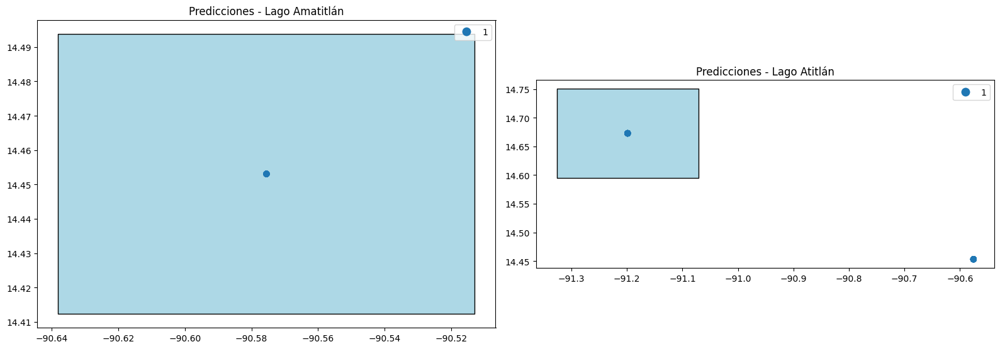

In [19]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Lago Amatitlán
gdf_amatitlan.plot(ax=axes[0], color="lightblue", edgecolor="black")

subset_amatitlan = gdf_pred[gdf_pred["lake"].str.contains("Amatit", case=False, na=False)]
if not subset_amatitlan.empty:
    subset_amatitlan.plot(
        ax=axes[0],
        column="contaminado_pred",
        categorical=True,
        legend=True,
        markersize=40
    )
axes[0].set_title("Predicciones - Lago Amatitlán")

# Lago Atitlán
gdf_atitlan.plot(ax=axes[1], color="lightblue", edgecolor="black")

subset_atitlan = gdf_pred[gdf_pred["lake"].str.contains("Atitl", case=False, na=False)]
if not subset_atitlan.empty:
    subset_atitlan.plot(
        ax=axes[1],
        column="contaminado_pred",
        categorical=True,
        legend=True,
        markersize=40
    )
axes[1].set_title("Predicciones - Lago Atitlán")

plt.tight_layout()
plt.show()


La visualización muestra, para ambos lagos, la ubicación espacial de los puntos evaluados con el modelo Random Forest, superpuestos sobre los polígonos que representan los contornos de cada cuerpo de agua. En el caso del lago Amatitlán (panel izquierdo), se observa un punto ubicado hacia el centro del lago que fue clasificado por el modelo como contaminado (clase 1), lo cual coincide con las zonas que presentan tradicionalmente mayores concentraciones de floraciones de cianobacterias. Esto sugiere que el modelo logra reconocer patrones espectrales característicos de estas floraciones en ubicaciones representativas del lago.

En el lago Atitlán (panel derecho), también se aprecia un punto clasificado con presencia de cianobacteria. Aunque se encuentra próximo al borde del lago, el modelo igualmente indica clase positiva, evidenciando su capacidad para detectar posibles eventos de bloom incluso en zonas no estrictamente centrales. Esta respuesta es coherente con el comportamiento más focalizado y menos generalizado de las floraciones en Atitlán respecto a Amatitlán.